<div align="center"><img src="https://drive.google.com/uc?export=download&id=1RHAO53B5qNbHqrWObI7623jtlLZBWD73" width="300" alt="NOVA IMS Logo">

  <br>
  <br>
  <b>Master in Data Science and Advanced Analytics</b>

  <b>Deep Learning</b>

  2025–2026
</div>

<b><h1> Skin Lesions </h1><b>

<table>
  <thead style="color:#96d9f0;">
    <tr>
      <th>Name</th>
      <th>Student ID</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>Bruna Caetano</td>
      <td>20250526</td>
    </tr>
    <tr>
      <td>Fausto Gomez</td>
      <td>20221915</td>
    </tr>
    <tr>
      <td>Francisco Graça</td>
      <td>20250471</td>
    </tr>
    <tr>
      <td>Maria Francisca Gonçalves</td>
      <td>20221942</td>
    </tr>
    <tr>
      <td>Tomás Gonçalves</td>
      <td>20221894</td>
    </tr>
  </tbody>
</table>

# **0. Set-Up**

In [ ]:
#Libraries
import os
import pandas as pd
import numpy as np
from tqdm import tqdm
import json

import seaborn as sns
import random
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as ss

import torch
import torchvision.transforms as T
import torchvision.models as models
from tqdm import tqdm
from collections import Counter
import umap
from PIL import Image
import cv2
import missingno as msno
import matplotlib.image as mpimg
#!pip install cleanvision
from cleanvision import Imagelab 
from concurrent.futures import ThreadPoolExecutor
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import KNNImputer, IterativeImputer
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import pairwise_distances

from sklearn.model_selection import GroupShuffleSplit

c:\Users\tomas\anaconda3\envs\clean_ml\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
base_path = "./data" 

image_dirs = [
    "HAM10000_images_part_1",
    "HAM10000_images_part_2",
    "ISIC2018_Task3_Test_Images"
]

image_paths = []

In [3]:
metadata_path = os.path.join(base_path, "HAM10000_metadata")
metadata_df = pd.read_csv(metadata_path, sep=",")
metadata_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern


In [4]:
merged_df_path = os.path.join(base_path, "merged_df_cleaned.csv")
merged_df = pd.read_csv(merged_df_path, sep=",")
merged_df.head()

,image_id,image_path,lesion_id,dx,dx_type,age,sex,localization,dataset,img_mean,img_std,width,height,umap_dist,is_outlier,cleaned_path
0,ISIC_0028291,./data/HAM10000_images_part_1/ISIC_0028291.jpg,HAM_0006253,mel,histo,65.0,male,back,vidir_modern,0.666128,0.154030,600,450,1.742259,False,./data\HAM10000_cleaned\ISIC_0028291_cleaned.jpg
1,ISIC_0028308,./data/HAM10000_images_part_1/ISIC_0028308.jpg,HAM_0003752,bkl,histo,50.0,female,chest,rosendahl,0.621565,0.091182,600,450,1.290727,False,./data\HAM10000_cleaned\ISIC_0028308_cleaned.jpg
2,ISIC_0028286,./data/HAM10000_images_part_1/ISIC_0028286.jpg,HAM_0005470,nv,follow_up,30.0,female,trunk,vidir_molemax,0.662481,0.200656,600,450,3.581251,False,./data\HAM10000_cleaned\ISIC_0028286_cleaned.jpg
3,ISIC_0028288,./data/HAM10000_images_part_1/ISIC_0028288.jpg,HAM_0004709,mel,histo,65.0,male,back,rosendahl,0.694768,0.142947,600,450,0.869381,False,./data\HAM10000_cleaned\ISIC_0028288_cleaned.jpg
4,ISIC_0028313,./data/HAM10000_images_part_1/ISIC_0028313.jpg,HAM_0004166,nv,follow_up,45.0,male,back,vidir_molemax,0.672074,0.212765,600,450,3.770117,False,./data\HAM10000_cleaned\ISIC_0028313_cleaned.jpg


# **1. Exploratory Data Analysis (EDA)**

**ESCREVER UMA CURTA ANÁLISE DEPOIS DE CADA GRÁFICO - POR FAZER**

### Diagnostic Class Definitions (dx)

| Code  | Meaning                                                                                                         |
|-------|-----------------------------------------------------------------------------------------------------------------|
| akiec | Actinic keratoses and intraepithelial carcinoma (Bowen’s disease).                                              |
| bcc   | Basal cell carcinoma.                                                                                           |
| bkl   | Benign keratosis-like lesions (solar lentigines, seborrheic keratoses, lichen‑planus–like keratoses).           |
| df    | Dermatofibroma.                                                                                                 |
| mel   | Melanoma.                                                                                                       |
| nv    | Melanocytic nevi.                                                                                               |
| vasc  | Vascular lesions (angiomas, angiokeratomas, pyogenic granulomas, hemorrhage).                                   |

### HAM10000 Metadata Dictionary


| Variable        | Description                                                                                           |
|-----------------|-------------------------------------------------------------------------------------------------------|
| image_id        | Unique identifier for each dermoscopic image (ISIC format).                                           |
| image_path      | Full filesystem path (cloud) to the stored image used for loading during preprocessing or training.           |
| lesion_id       | Identifier for the underlying skin lesion.              |
| dx              | Diagnostic label (one of the 7 HAM10000 classes: akiec, bcc, bkl, df, mel, nv, vasc).                 |
| dx_type         | Method used to obtain the diagnosis (histo, follow_up, consensus, confocal).                          |
| age             | Patient age in years at the time of imaging.                                                          |
| sex             | Patient sex (male, female, or unknown).                                                               |
| localization    | Anatomical site of the lesion (e.g., back, chest, trunk, lower extremity).                            |
| dataset       | Source of image acquisition

## 1.1 Class Distribution and Imbalance

The dataset shows a **strongly imbalanced class distribution**, with nevus (nv) dominating the sample count by a large margin, while other patologies appear far less frequently. <br><br>
This creates challenges for model training because a network may learn to favor the majority class and underperform on minority, which should be taken into consideration in the development of models.




In [5]:
# NOTINHAS A APAGAR :)

"""
Several strategies can help mitigate this imbalance during model development:
- Stratified splitting to preserve class proportions across train/validation/test sets.
- Class‑balanced sampling or oversampling of minority classes to ensure the model sees enough examples.
- Loss‑based approaches such as class‑weighted cross‑entropy or focal loss to penalize misclassification of rare classes more strongly.
- Targeted augmentation for underrepresented diagnoses to increase visual diversity.
- Evaluation beyond accuracy, using metrics like F1‑score, balanced accuracy, and per‑class sensitivity to avoid misleading performance estimates.
"""

'\nSeveral strategies can help mitigate this imbalance during model development:\n- Stratified splitting to preserve class proportions across train/validation/test sets.\n- Class‑balanced sampling or oversampling of minority classes to ensure the model sees enough examples.\n- Loss‑based approaches such as class‑weighted cross‑entropy or focal loss to penalize misclassification of rare classes more strongly.\n- Targeted augmentation for underrepresented diagnoses to increase visual diversity.\n- Evaluation beyond accuracy, using metrics like F1‑score, balanced accuracy, and per‑class sensitivity to avoid misleading performance estimates.\n'

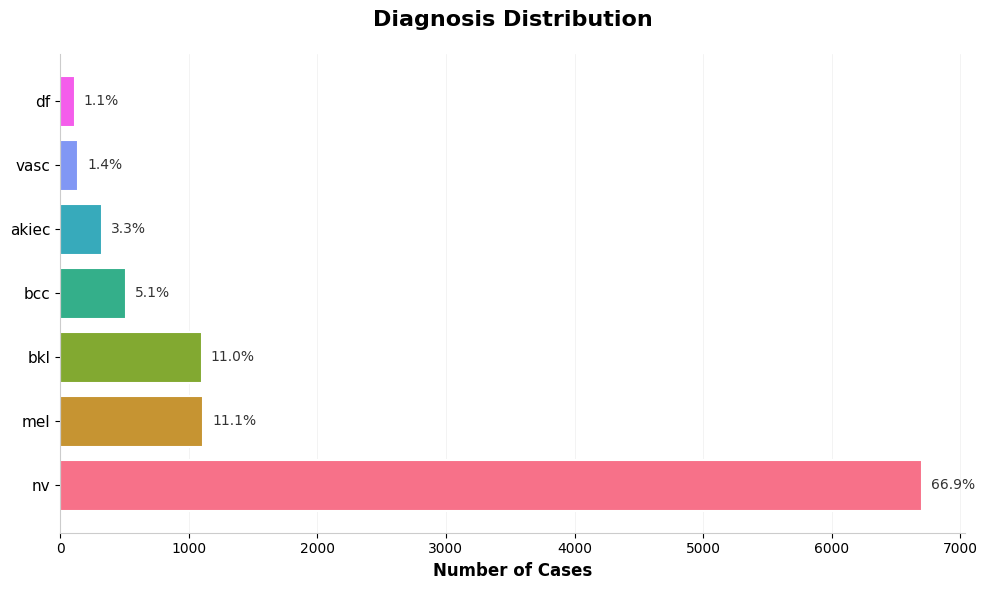


Diagnosis Distribution (%)
dx
nv       66.9
mel      11.1
bkl      11.0
bcc       5.1
akiec     3.3
vasc      1.4
df        1.1
Name: proportion, dtype: float64


In [6]:
fig, ax = plt.subplots(figsize=(10, 6))

dx_counts = merged_df["dx"].value_counts()
dx_pct = (merged_df["dx"].value_counts(normalize=True) * 100).round(1)

colors = sns.color_palette("husl", len(dx_counts))

# Horizontal bar plot
bars = ax.barh(range(len(dx_counts)), dx_counts.values, color=colors, edgecolor='white', linewidth=1.5)

ax.set_yticks(range(len(dx_counts)))
ax.set_yticklabels(dx_counts.index, fontsize=11, fontweight='500')
ax.set_xlabel('Number of Cases', fontsize=12, fontweight='bold')
ax.set_title('Diagnosis Distribution', fontsize=16, fontweight='bold', pad=20)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#CCCCCC')
ax.spines['bottom'].set_color('#CCCCCC')

ax.grid(axis='x', alpha=0.2, linestyle='-', linewidth=0.5)
ax.set_axisbelow(True)

# Add value labels
for i, (count, pct) in enumerate(zip(dx_counts.values, dx_pct.values)):
    ax.text(count + max(dx_counts.values)*0.01, i, f'{pct}%', 
            va='center', fontsize=10, fontweight='500', color='#333333')

plt.tight_layout()
plt.show()

print("\nDiagnosis Distribution (%)")
print(dx_pct)


## 1.2 Demographic Patters

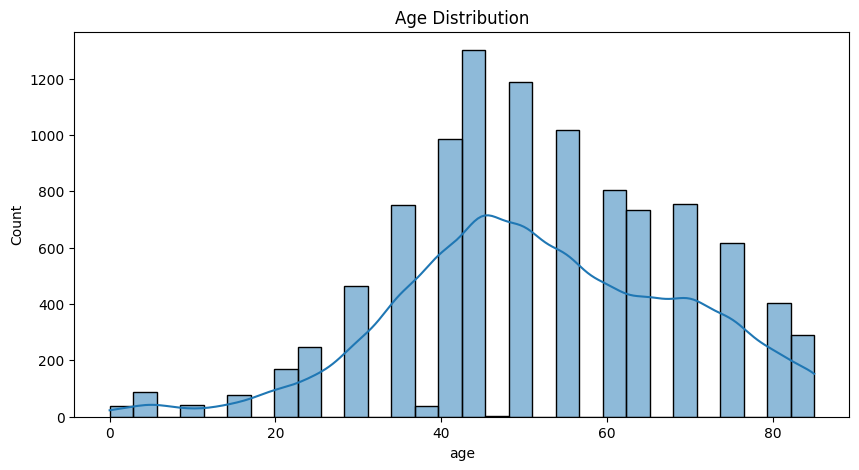

In [7]:
# Age Distribution
plt.figure(figsize=(10,5))
sns.histplot(merged_df["age"], kde=True, bins=30)
plt.title("Age Distribution")
plt.show()

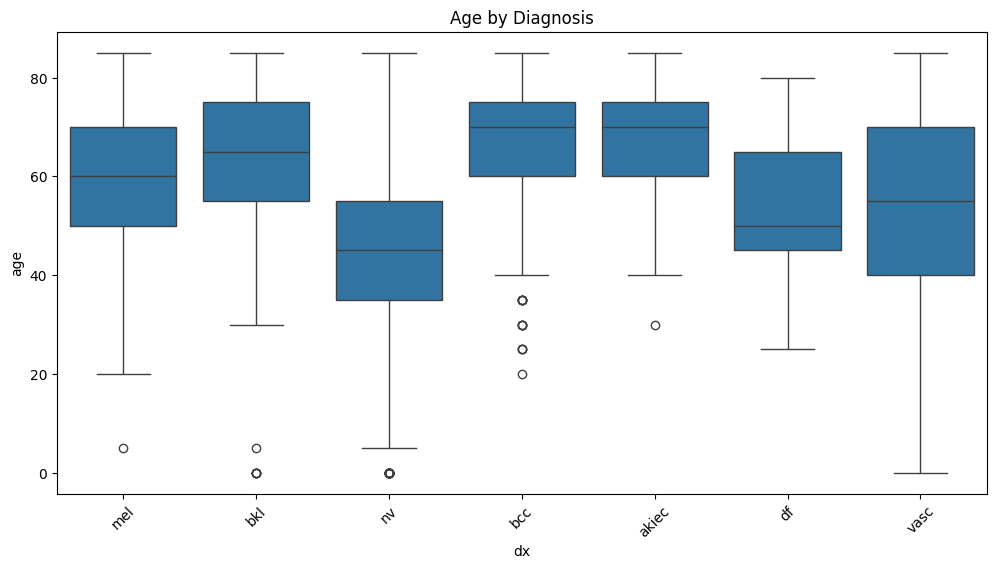

In [8]:
#Age vs diagnosis
plt.figure(figsize=(12,6))
sns.boxplot(data=merged_df, x="dx", y="age")
plt.xticks(rotation=45)
plt.title("Age by Diagnosis")
plt.show()

C:\Users\tomas\AppData\Local\Temp\ipykernel_11992\2819589059.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=merged_df, x="dx", y="age", order=dx_order, palette="Set2", ax=axes[0])


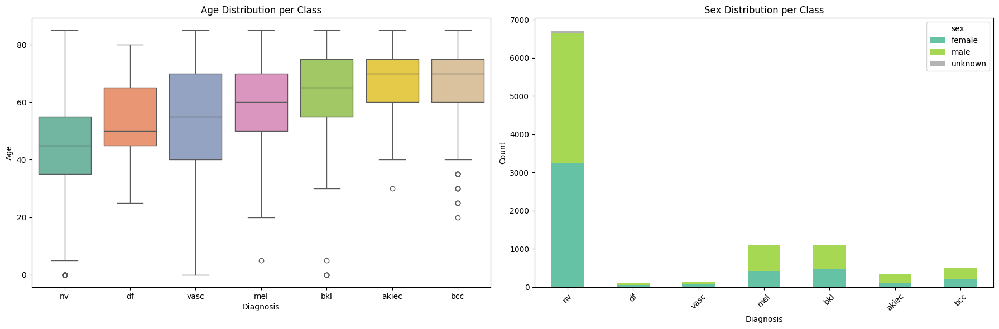

In [9]:
# Age & Sex distribution per class

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Age
dx_order = merged_df.groupby("dx")["age"].median().sort_values().index

sns.boxplot(data=merged_df, x="dx", y="age", order=dx_order, palette="Set2", ax=axes[0])
axes[0].set_title("Age Distribution per Class")
axes[0].set_xlabel("Diagnosis")
axes[0].set_ylabel("Age")

# Sex
sex_counts = merged_df.groupby(["dx", "sex"]).size().unstack(fill_value=0)
sex_counts = sex_counts.loc[dx_order]  # same order as boxplot
sex_counts.plot(kind="bar", stacked=True, colormap="Set2", ax=axes[1])
axes[1].set_title("Sex Distribution per Class")
axes[1].set_xlabel("Diagnosis")
axes[1].set_ylabel("Count")
axes[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

## 1.3 Body Location

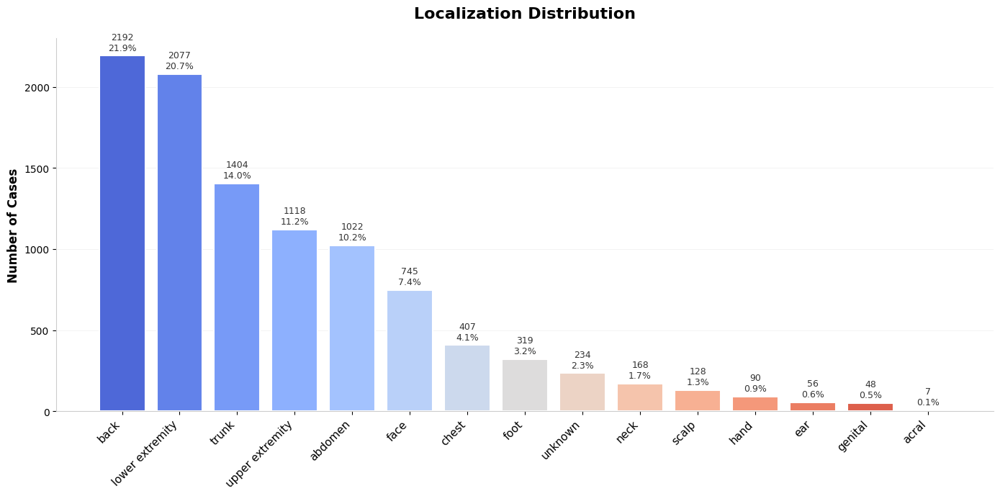


Localization Distribution (%)
localization
back               21.9
lower extremity    20.7
trunk              14.0
upper extremity    11.2
abdomen            10.2
face                7.4
chest               4.1
foot                3.2
unknown             2.3
neck                1.7
scalp               1.3
hand                0.9
ear                 0.6
genital             0.5
acral               0.1
Name: proportion, dtype: float64


In [10]:
fig, ax = plt.subplots(figsize=(14, 7))

loc_counts = merged_df["localization"].value_counts()
loc_pct = (merged_df["localization"].value_counts(normalize=True) * 100).round(1)

colors = sns.color_palette("coolwarm", len(loc_counts))

bars = ax.bar(range(len(loc_counts)), loc_counts.values, color=colors, edgecolor='white', linewidth=1.5)

ax.set_xticks(range(len(loc_counts)))
ax.set_xticklabels(loc_counts.index, fontsize=11, fontweight='500', rotation=45, ha='right')
ax.set_ylabel('Number of Cases', fontsize=12, fontweight='bold')
ax.set_title('Localization Distribution', fontsize=16, fontweight='bold', pad=20)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#CCCCCC')
ax.spines['bottom'].set_color('#CCCCCC')

ax.grid(axis='y', alpha=0.2, linestyle='-', linewidth=0.5)
ax.set_axisbelow(True)

for i, (count, pct) in enumerate(zip(loc_counts.values, loc_pct.values)):
    ax.text(i, count + max(loc_counts.values)*0.01, f'{int(count)}\n{pct}%', 
            ha='center', va='bottom', fontsize=9, fontweight='500', color='#333333')

plt.tight_layout()
plt.show()

print("\nLocalization Distribution (%)")
print(loc_pct)

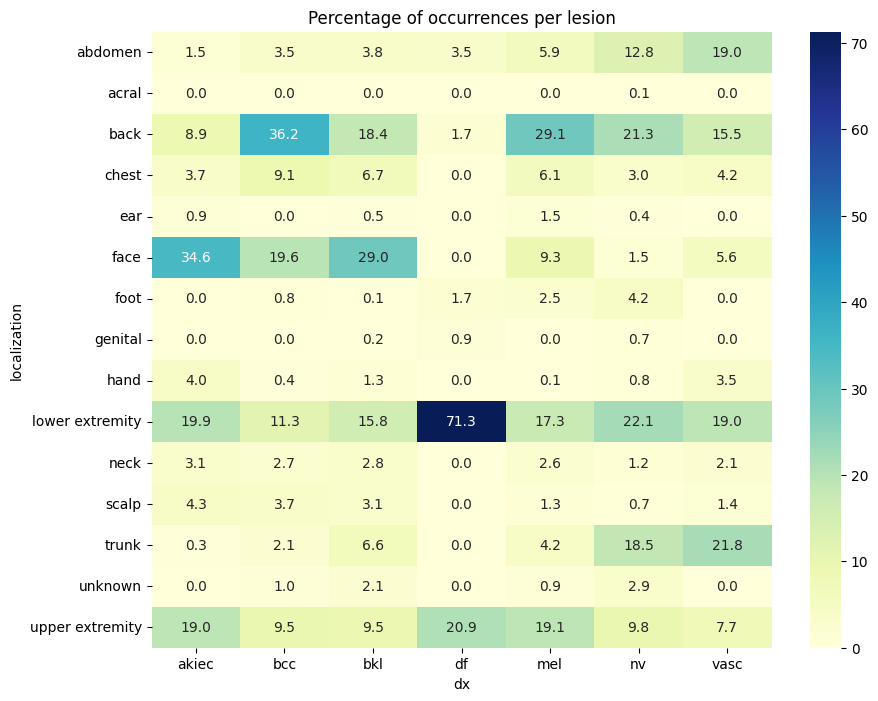

In [11]:
ct = pd.crosstab(merged_df['localization'], merged_df['dx'], normalize='columns') * 100

plt.figure(figsize=(10, 8))
sns.heatmap(ct, annot=True, cmap='YlGnBu', fmt='.1f')
plt.title('Percentage of occurrences per lesion')
plt.show()

C:\Users\tomas\AppData\Local\Temp\ipykernel_11992\520570325.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(x='localization', y='age', data=merged_df, palette='viridis')


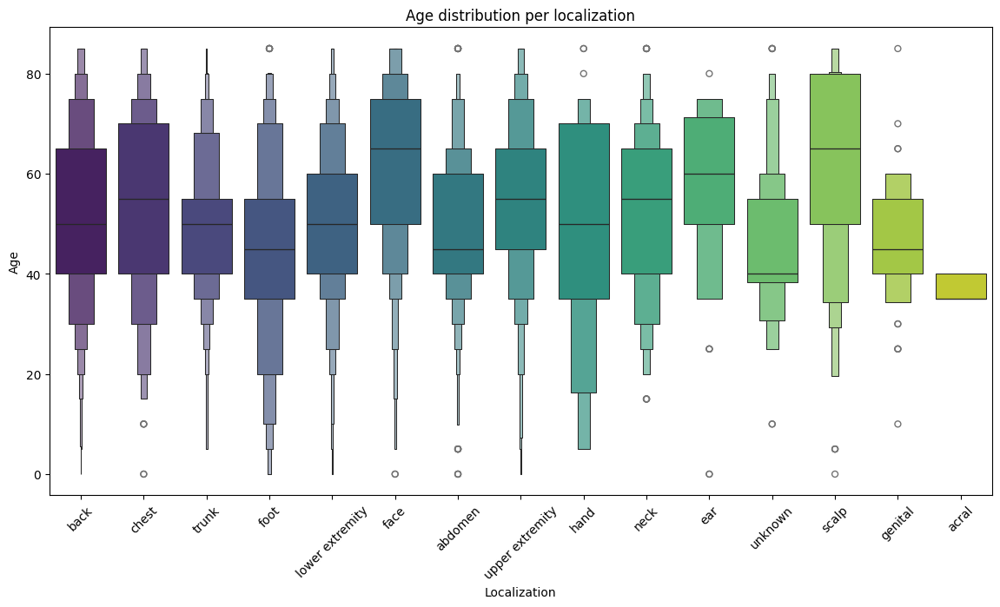

In [12]:
plt.figure(figsize=(14, 7))
sns.boxenplot(x='localization', y='age', data=merged_df, palette='viridis')
plt.xticks(rotation=45)
plt.title('Age distribution per localization')
plt.xlabel('Localization')
plt.ylabel('Age')
plt.show()

## 1.4 Image Level EDA

In [13]:
# Colab Version
colab_prefix = "/content/drive/MyDrive/MDSAA-DS/DL-project/dataverse_files/"

# VSCode Version
local_prefix = "./data/"
merged_df["image_path"] = merged_df["image_path"].str.replace(colab_prefix, local_prefix)
print(merged_df["image_path"].head())

0    ./data/HAM10000_images_part_1/ISIC_0028291.jpg
1    ./data/HAM10000_images_part_1/ISIC_0028308.jpg
2    ./data/HAM10000_images_part_1/ISIC_0028286.jpg
3    ./data/HAM10000_images_part_1/ISIC_0028288.jpg
4    ./data/HAM10000_images_part_1/ISIC_0028313.jpg
Name: image_path, dtype: object


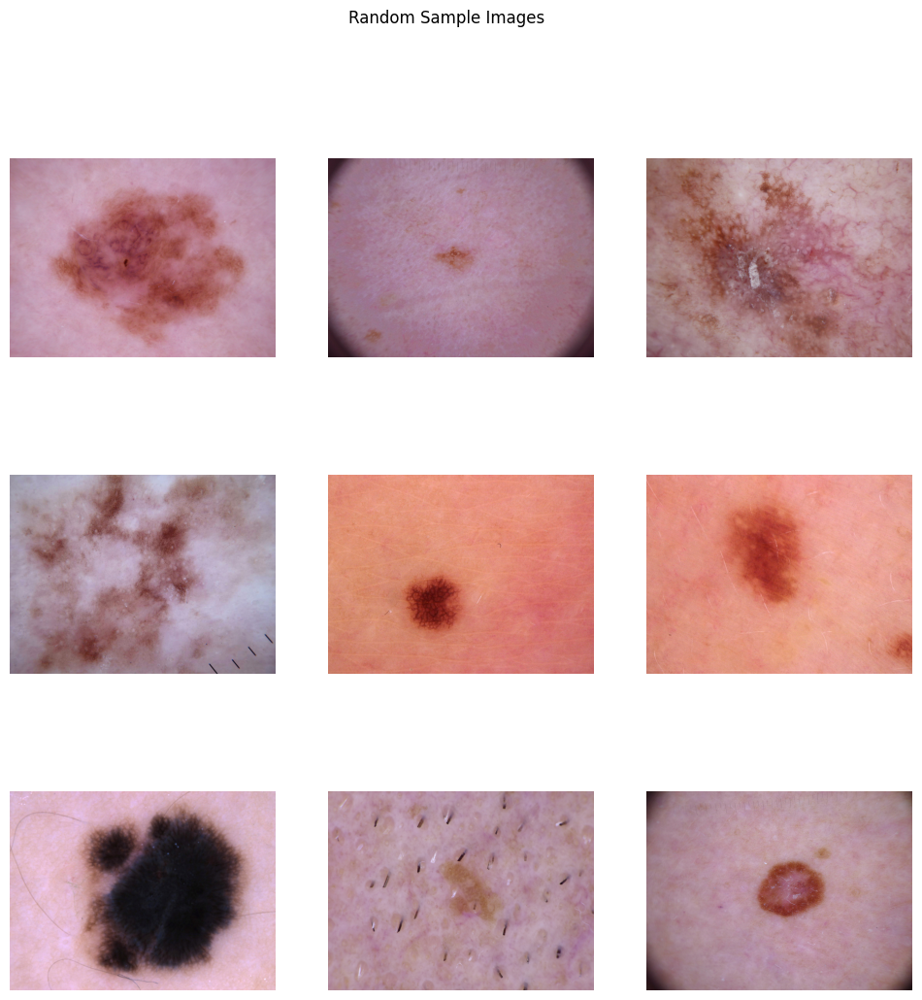

In [14]:
# Display random images

sample_paths = merged_df["image_path"].sample(9).tolist()

plt.figure(figsize=(12,12))
for i, path in enumerate(sample_paths):
    plt.subplot(3,3,i+1)
    img = Image.open(path)
    plt.imshow(img)
    plt.axis("off")
plt.suptitle("Random Sample Images")
plt.show()

In [15]:
def load_image_info(path):
    with Image.open(path) as img:
        mode = img.mode
        w, h = img.size
        arr = np.array(img.convert("RGB"))
    normalized = arr / 255.0
    mean = normalized.mean()
    std  = normalized.std()
    return mode, w, h, mean, std, arr

In [16]:
img_stats_df = merged_df.copy()[['image_path', 'dx', 'lesion_id']]

with ThreadPoolExecutor(max_workers=64) as executor:
    results = list(tqdm(executor.map(load_image_info, img_stats_df['image_path']), total=len(img_stats_df)))

modes, widths, heights, means, stds, arrays = map(list, zip(*results))

# POPULATE DF 
img_stats_df["width"]     = widths
img_stats_df["height"]    = heights
img_stats_df["img_mean"]  = means
img_stats_df["img_std"]   = stds

arrays = np.stack(arrays)
print(f"Loaded {len(arrays)} images")

100%|██████████| 10015/10015 [00:10<00:00, 923.65it/s] 


Loaded 10015 images


In [17]:
# MODE DISTRIBUTION 
print(f"Modes: {set(modes)} - All images are RGB!")

Modes: {'RGB'} - All images are RGB!


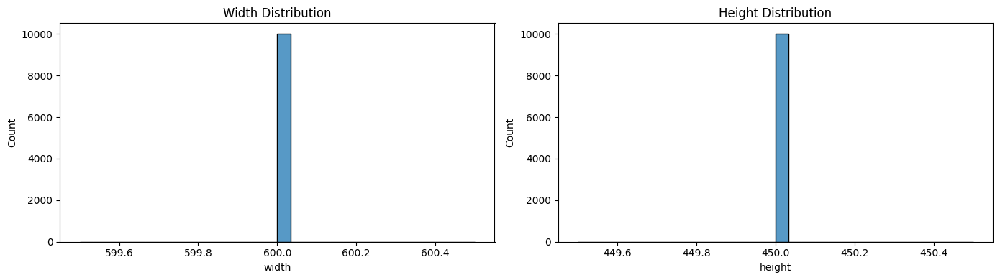

<Figure size 640x480 with 0 Axes>

In [18]:
# SIZE DISTRIBUTIONS
fig, axes = plt.subplots(1, 2, figsize=(14, 4))
sns.histplot(img_stats_df["width"],    bins=30, ax=axes[0]).set_title("Width Distribution")
sns.histplot(img_stats_df["height"],   bins=30, ax=axes[1]).set_title("Height Distribution")
plt.tight_layout()
plt.show()

# BRIGHTNESS / CONTRAST 
sns.histplot(img_stats_df["img_mean"], bins=30, ax=axes[0]).set_title("Brightness Distribution")
sns.histplot(img_stats_df["img_std"],  bins=30, ax=axes[1]).set_title("Contrast Distribution")
plt.tight_layout()
plt.show()

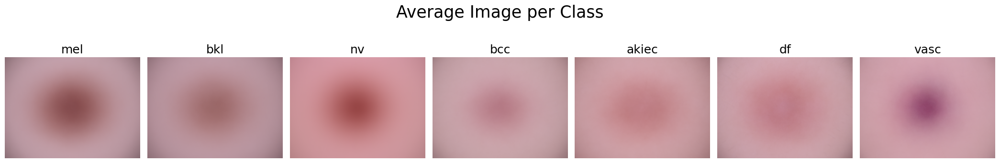

In [19]:
# AVERAGE IMAGE PER CLASS
classes = img_stats_df["dx"].unique()
fig, axes = plt.subplots(1, len(classes), figsize=(len(classes) * 3, 4))

for i, cls in enumerate(classes):
    idx = img_stats_df[img_stats_df["dx"] == cls].index
    mean_img = arrays[idx].mean(axis=0).astype(np.uint8)
    axes[i].imshow(mean_img)
    axes[i].set_title(cls, fontsize=18)
    axes[i].axis("off")

plt.suptitle("Average Image per Class", fontsize=25)
plt.tight_layout()
plt.show()

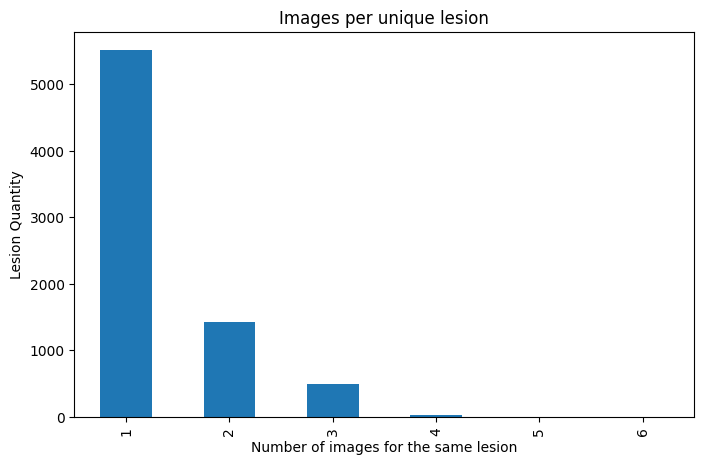

In [20]:
# IMAGES PER LESION 
count_lesions = img_stats_df.groupby("lesion_id").size().value_counts().sort_index()
count_lesions.plot(kind="bar", figsize=(8, 5))
plt.title("Images per unique lesion")
plt.xlabel("Number of images for the same lesion")
plt.ylabel("Lesion Quantity")
plt.show()

## 1.5 Lesion ID Analysis

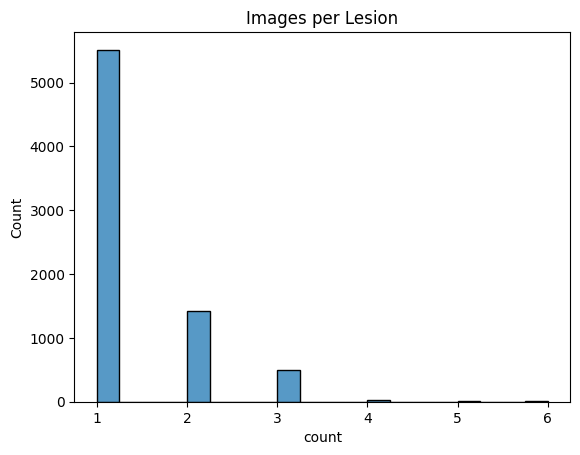

lesion_id
HAM_0005263    6
HAM_0001863    6
HAM_0003789    6
HAM_0000835    6
HAM_0000893    5
Name: count, dtype: int64

In [21]:
lesion_counts = merged_df["lesion_id"].value_counts()
lesion_counts.describe()

sns.histplot(lesion_counts, bins=20)
plt.title("Images per Lesion")
plt.show()

# Check lesions with multiple images
lesion_counts[lesion_counts > 1].head()

## 1.6 Confirmation Method Analysis

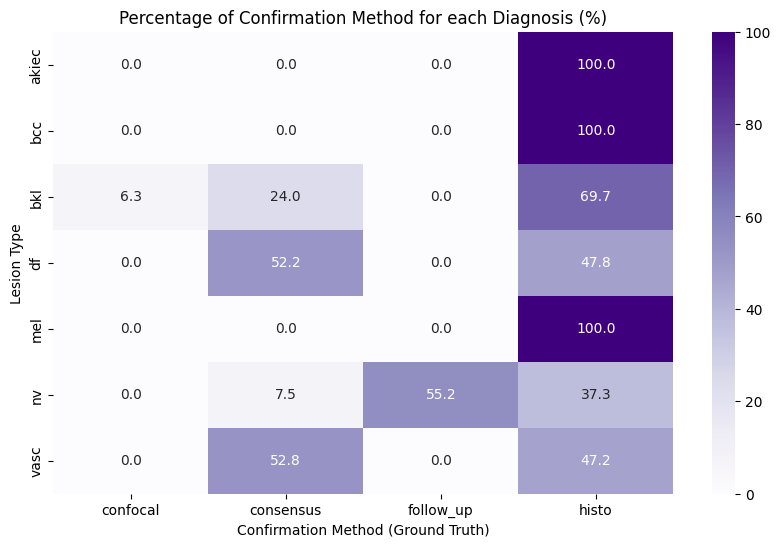

In [22]:
conf_ct = pd.crosstab(merged_df['dx'], merged_df['dx_type'], normalize='index') * 100

plt.figure(figsize=(10, 6))
sns.heatmap(conf_ct, annot=True, cmap='Purples', fmt='.1f')
plt.title('Percentage of Confirmation Method for each Diagnosis (%)')
plt.xlabel('Confirmation Method (Ground Truth)')
plt.ylabel('Lesion Type')
plt.show()

## 1.7 Advanced Visual EDA (UMAP on Image Embeddings)

In [ ]:
"""
# VERSAO KERAS
from keras.applications import ResNet50
from keras.preprocessing.image import load_img, img_to_array

base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')
base_model.trainable = False
 
embedding_model = keras.Model(inputs=base_model.input, outputs=base_model.output)

# Prepare image transformation
def load_and_transform(image_path, target_size=(224, 224)):
    # Load and preprocess image for ResNet
    img = load_img(image_path, target_size=target_size)
    x = img_to_array(img)
    # ResNet expects normalized images (ImageNet normalization)
    x = keras.applications.resnet50.preprocess_input(x)
    return np.expand_dims(x, axis=0)
 
# Extract embeddings
embeddings = []
 
for path in tqdm(merged_df["image_path"]):
    try:
        x = load_and_transform(path)
        emb = embedding_model.predict(x, verbose=0).squeeze()
        embeddings.append(emb)
    except Exception as e:
        print(f"Error processing {path}: {e}")
 
embeddings = np.array(embeddings)
 
# Apply UMAP
reducer = umap.UMAP()
embedding_2d = reducer.fit_transform(embeddings)
 
# Visualize
plt.figure(figsize=(10, 8))
sns.scatterplot(x=embedding_2d[:, 0], y=embedding_2d[:, 1], 
                hue=merged_df["dx"], palette="tab10")
plt.title("UMAP of Image Embeddings")
plt.show()
"""

C:\Users\tomas\AppData\Roaming\Python\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\tomas\AppData\Roaming\Python\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 10015/10015 [26:26<00:00,  6.31it/s]


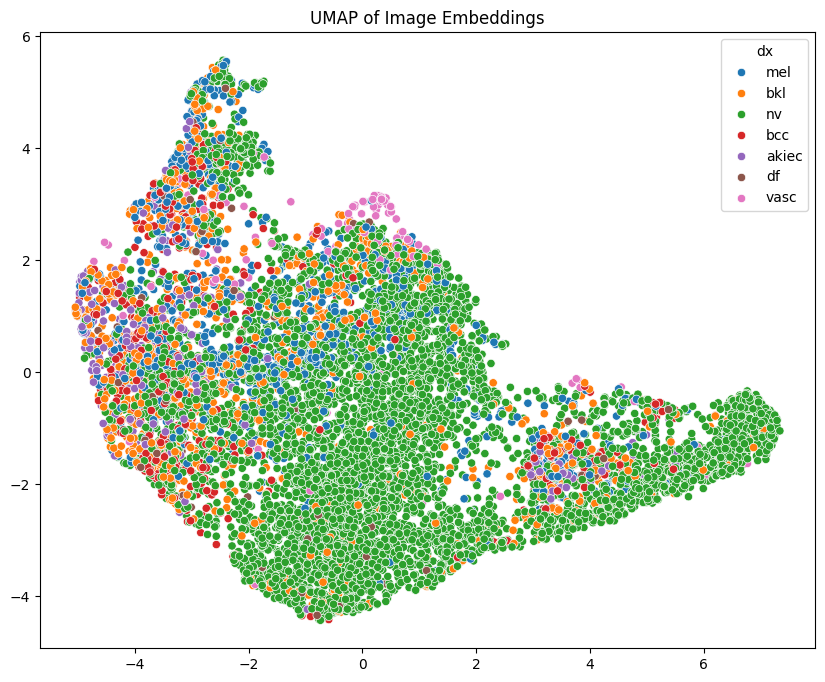

In [23]:
model = models.resnet18(pretrained=True)
model = torch.nn.Sequential(*list(model.children())[:-1])
model.eval()

transform = T.Compose([
    T.Resize((224,224)),
    T.ToTensor()
])

embeddings = []

for path in tqdm(merged_df["image_path"]):
    img = Image.open(path).convert("RGB")
    x = transform(img).unsqueeze(0)
    with torch.no_grad():
        emb = model(x).squeeze().numpy()
    embeddings.append(emb)

reducer = umap.UMAP()
embedding_2d = reducer.fit_transform(embeddings)

plt.figure(figsize=(10,8))
sns.scatterplot(x=embedding_2d[:,0], y=embedding_2d[:,1], hue=merged_df["dx"], palette="tab10")
plt.title("UMAP of Image Embeddings")
plt.show()


## 1.8 Duplicated lesions case

The structure:
- understand the lesion that has the highest number of images "HAM_0003789".
- Test to understand if there are characteristics that change for the same lesion
- Distribution of duplicates in the variables and the respective percentages.

Key findings:

- 9 lesions have images from different `dataset` sources, and 2 of those also show different `localization` values.

- **Diagnosis (dx) & Severity**: More severe/suspicious lesions have significantly higher duplication rates. Melanoma (mel, 62.5%) and Basal Cell Carcinoma (bcc, 46.5%) are the most frequently duplicated, while common nevi (nv) are the least (18.3%).
- **Verification Method (dx_type)**: Lesions requiring deep clinical verification (e.g., confocal at 73.5% and histo at 55.5%) present the highest duplications. Conversely, follow_up has a 0% duplication rate, implying that maybe temporal follow-ups are being recorded as entirely distinct lesions rather than duplicate images attached to the same lesion ID.
- **Localization (Anatomy)**: Complex, hard-to-photograph, or high-risk anatomical areas exhibit higher duplication rates, led by acral (66.7%), chest (52.9%), and ear (51.4%). (1- Zona Acral (Palmas das mãos e plantas dos pés e unhas). 2- Orelhas (Pavilhão auricular e canal auditivo externo). 3-Nariz (Especialmente as abas nasais e a ponta). 4- Pálpebras)
- **Dataset Source Bias**: Duplication behaviors are heavily protocol-driven. The vidir_modern dataset contains 74.5% duplications, whereas vidir_molemax has none (0%). This might be a crucial finding for train/test splits to ensure models don't inadvertently learn these dataset-specific duplication behaviors.


**Next steps:**
Handling Lesion Duplicates & Train/Test Splitting

1. Quick Data Cleanup
- remove the 2 lesions with different locations.
- dont use dataset origin for the modeling.


2. Splitting Options
-  We group all images by `lesion_id` so that all images of the same lesion stay together. We then randomly split 80/20 at the *lesion level*, making sure to stratify by diagnosis (`dx`) so the class proportions stay balanced.
-  Any lesion with >1 image automatically goes into the Training set. We only perform the 80/20 split on lesions that have exactly 1 image.

## 1.9 Resizing

**Dataset Uniformity**

A significant advantage in our preprocessing phase is that all original images in our dataset share a uniform resolution of `600x450` pixels (a `4:3` aspect ratio). This consistency considerably simplifies our pipeline, as it removes the need to dynamically handle variable baseline shapes before applying transformations.

**The Modeling Standard**

In standard transfer learning pipelines, it is common practice to resize inputs to a rigid `224x224` square. This standard originates from the ImageNet dataset, upon which most foundational pre-trained models were trained. Because the internal convolutional filters of these networks were mathematically optimized to recognize textures and features at this specific `224` pixel scale, mimicking this resolution is generally recommended to maximize feature extraction.

**Our Pipeline Approach**

However, forcing a `600x450` clinical image into a rigid square induces spatial distortion, artificially warping the geometric symmetry of the lesions. While most standard models expect square images, removing the classifier head (e.g., using `include_top=False`) and applying Global Average Pooling allows the pretrained convolutional base to process non-square, rectangular inputs without error.

To systematically determine which approach yields the highest classification accuracy, our pipeline evaluates five distinct resizing configurations:

1. Standard Square (Deformation): Forcing the image to `224x224`. This retains all lesion margins but distorts biological symmetry.

2. Padded Square: Scaling the long edge to `224` and padding the remainder to create a `224x224` square. This preserves exact geometry and margins but introduces artificial border artifacts.

3. Center Crop Square: Scaling the short edge to `224` and extracting the central `224x224` region. This maintains geometry but risks trimming peripheral lesion boundaries.

4. Short-Edge Rectangle: Scaling the short edge to `224` while maintaining the native `4:3` aspect ratio, resulting in a `300x224` input.

5. Area-Matched Rectangle: Scaling the image to maintain its native `4:3` ratio while matching the total pixel area of the ImageNet standard (roughly `50,176` total pixels). By resizing to exactly `256x192`, we preserve natural symmetry while ensuring the physical size of the lesion features remains perfectly scaled for the pretrained filters.

**Visualizations of Resized Images**

To better understand the geometric trade-offs of these techniques prior to modeling, visual representations of a sample image subjected to all five formatting strategies are provided below.

**Conclusions Regarding the 5 formats**

````
After modeling....

# 2. Data Quality Verification

## 2.1 Duplicates

### 2.1.1 Metadata Duplicates

In [24]:
# Exact duplicate rows
print(f"Exact duplicate rows: {merged_df.duplicated().sum()}")

# Lesions with multiple images (not an error, but important)
merged_df["lesion_id"].value_counts().head()

Exact duplicate rows: 0


lesion_id
HAM_0005263    6
HAM_0001863    6
HAM_0003789    6
HAM_0000835    6
HAM_0000893    5
Name: count, dtype: int64

### 2.1.2 Image-Level Duplicates & Issues

To ensure dataset integrity, we investigated two potential sources of duplicate images:

**Path-level duplicates** — two or more rows referencing the same image path, and therefore loading the same image.

**Pixel-level duplicates** — rows with distinct paths but identical pixel content.

In [25]:
print(f"Number of rows with the same image path: {len(merged_df) - merged_df['image_path'].nunique()}")

Number of rows with the same image path: 0


The first hypothesis was ruled out by inspection. To verify the second, we employed the CleanVision ImageLab library, which flags images sharing identical or near-identical pixel arrays. Additionally, we decided to leverage all the capabilities of the stated library, by searching for other issues, such as blurry, low information, and near duplicated images.

Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


Computing hashes: 100%|██████████| 10015/10015 [01:28<00:00, 112.92it/s]


Issue checks completed. 416 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | blurry           |          378 |
|  1 | near_duplicates  |           34 |
|  2 | exact_duplicates |            4 |
|  3 | dark             |            0 |
|  4 | light            |            0 |
|  5 | odd_aspect_ratio |            0 |
|  6 | low_information  |            0 |
|  7 | grayscale        |            0 |
|  8 | odd_size         |            0 | 

---------------------- blurry images -----------------------

Number of examples with this issue: 378
Examples representing most severe instances of this issue:



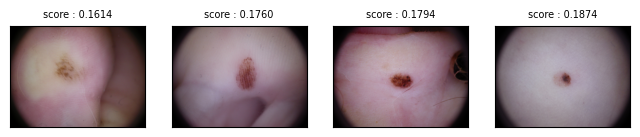

------------------ near_duplicates images ------------------

Number of examples with this issue: 34
Examples representing most severe instances of this issue:

Set: 0


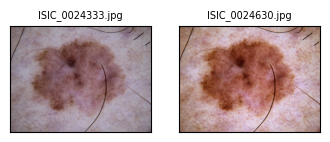

Set: 1


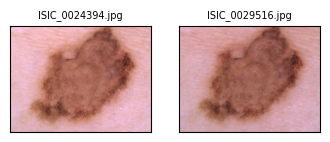

Set: 2


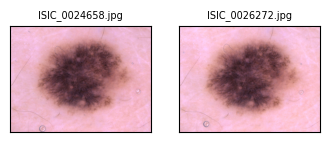

Set: 3


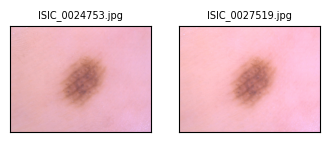

----------------- exact_duplicates images ------------------

Number of examples with this issue: 4
Examples representing most severe instances of this issue:

Set: 0


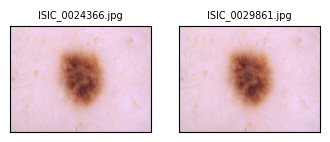

Set: 1


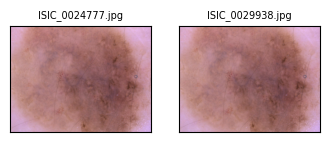

In [30]:
# Searching for images with issues
imagelab = Imagelab(filepaths=list(merged_df["image_path"]))
imagelab.find_issues()
imagelab.report(verbosity=4)

**Exact duplicates:**

6 images were identified. One case involved a duplicated image_id, while the remaining corresponded to duplicated lesion_id entries. In both situations, only one image per pair carries unique information, and the redundant copies were removed from the da

In [31]:
# Filtering all the duplicated images paths
duplicated_paths = imagelab.issues[["is_exact_duplicates_issue"]].any(axis=1).reset_index().rename(columns={"index": "image_path", 0: "duplicated"})
duplicated_paths = duplicated_paths.loc[duplicated_paths["duplicated"] == True]
merged_df.iloc[duplicated_paths.index].sort_values('lesion_id')

,image_id,image_path,lesion_id,dx,dx_type,age,sex,localization,dataset,img_mean,img_std,width,height,umap_dist,is_outlier,cleaned_path
4472,ISIC_0024777,./data/HAM10000_images_part_1/ISIC_0024777.jpg,HAM_0001895,nv,histo,25.0,male,chest,vienna_dias,0.548301,0.150770,600,450,1.681978,False,./data\HAM10000_cleaned\ISIC_0024777_cleaned.jpg
9607,ISIC_0029938,./data/HAM10000_images_part_2/ISIC_0029938.jpg,HAM_0001895,nv,histo,25.0,male,chest,vienna_dias,0.548301,0.150770,600,450,1.616145,False,./data\HAM10000_cleaned\ISIC_0029938_cleaned.jpg
4061,ISIC_0024366,./data/HAM10000_images_part_1/ISIC_0024366.jpg,HAM_0002300,nv,histo,35.0,female,back,vienna_dias,0.802755,0.161287,600,450,3.634978,False,./data\HAM10000_cleaned\ISIC_0024366_cleaned.jpg
9532,ISIC_0029861,./data/HAM10000_images_part_2/ISIC_0029861.jpg,HAM_0002300,nv,histo,35.0,female,back,vienna_dias,0.802755,0.161287,600,450,3.663900,False,./data\HAM10000_cleaned\ISIC_0029861_cleaned.jpg


In [32]:
print(f"Dataset size before removing the exact duplicates: {len(merged_df)}")
merged_df = merged_df.drop([9642, 9538, 2665])
print(f"Dataset size after removing the exact duplicates: {len(merged_df)}")

Dataset size before removing the exact duplicates: 10015
Dataset size after removing the exact duplicates: 10012


**Near-duplicates:**

34 images were flagged. Upon inspection, all near-duplicate pairs were found to have distinct lesion_id values, indicating that despite their visual similarity they represent genuinely different lesions. All near-duplicate images were therefore retained.

In [33]:
# Filtering all the duplicated images paths
near_duplicated_paths = imagelab.issues[["is_near_duplicates_issue"]].any(axis=1).reset_index().rename(columns={"index": "image_path", 0: "near_duplicated"})
near_duplicated_paths = near_duplicated_paths.loc[near_duplicated_paths["near_duplicated"] == True]
near_duplicated = merged_df.iloc[near_duplicated_paths.index].sort_values('lesion_id')

print(f"Number of repeated near duplicated images with the same lesion_id: {len(near_duplicated) - len(near_duplicated['lesion_id'].unique())}")

Number of repeated near duplicated images with the same lesion_id: 0


**Blurry images:**

 378 images were flagged.

In [34]:
blurry_paths = imagelab.issues[imagelab.issues["is_blurry_issue"]].any(axis=1).reset_index().rename(columns={"index": "image_path", 0: "blurry"})
blurry_paths = blurry_paths.loc[blurry_paths["blurry"] == True]
blurry_df = merged_df.iloc[blurry_paths.index].sort_values('lesion_id')

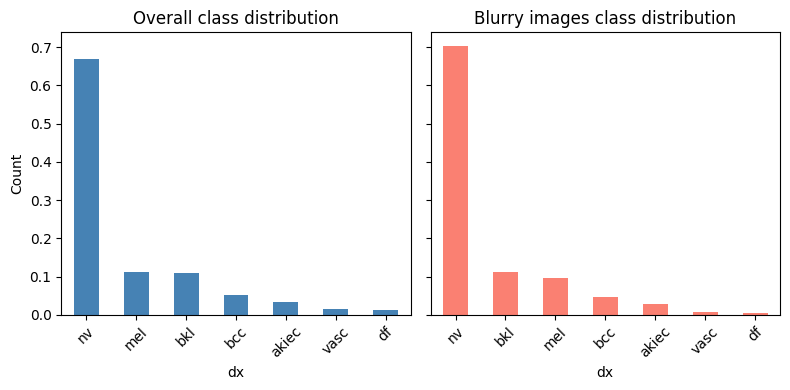

In [35]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharey=True)

# overall
merged_df["dx"].drop(blurry_df.index).value_counts(normalize='true').plot(kind="bar", ax=axes[0], color="steelblue")
axes[0].set_title("Overall class distribution")
axes[0].set_ylabel("Count")
axes[0].tick_params(axis="x", rotation=45)

# blurry
merged_df.loc[blurry_df.index, "dx"].value_counts(normalize='true').plot(kind="bar", ax=axes[1], color="salmon")
axes[1].set_title("Blurry images class distribution")
axes[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

Their class distribution was found to be consistent with the overall dataset, indicating that blurriness occurs as random noise rather than being concentrated in any specific class. We opted to retain these images for two reasons: first, their removal would disproportionately reduce the already dominant nv class without providing meaningful benefit to minority classes; second, exposure to variable image quality during training is likely to improve model robustness, as real-world clinical images are inherently heterogeneous in quality.

## 2.2 Missing Values

In [36]:
# Count missing values per column
merged_df.isna().sum()

# Percentage of missing values
merged_df.isna().mean() * 100

image_id        0.0
image_path      0.0
lesion_id       0.0
dx              0.0
dx_type         0.0
age             0.0
sex             0.0
localization    0.0
dataset         0.0
img_mean        0.0
img_std         0.0
width           0.0
height          0.0
umap_dist       0.0
is_outlier      0.0
cleaned_path    0.0
dtype: float64

## 2.3 Outlier Detection

In [37]:
# Summary statistics
merged_df.describe()

,age,img_mean,img_std,width,height,umap_dist
count,10012.000000,10012.000000,10012.000000,10012.0,10012.0,10012.000000
mean,51.813010,0.626704,0.160816,600.0,450.0,3.126541
std,16.943419,0.075209,0.045260,0.0,0.0,1.435211
min,0.000000,0.249514,0.040754,600.0,450.0,0.020189
25%,40.000000,0.575649,0.124786,600.0,450.0,2.057637
50%,50.000000,0.626619,0.164520,600.0,450.0,3.093660
75%,65.000000,0.677171,0.194518,600.0,450.0,3.963778
max,85.000000,0.908904,0.351937,600.0,450.0,7.060075


## 3. Data Split - novo mary

- **The split happens BEFORE any preprocessing to prevent data leakage.**
-  All imputers and outlier thresholds are fitted exclusively on the training set.

In [38]:
def create_dl_splits(df, train_frac=0.8, val_frac=0.1, test_frac=0.1, random_state=42):
    """
    Splits the dataset into Train, Validation, and Test sets.
    Ensures all images of the same lesion_id stay in the same set to prevent leakage.
    """
    temp_frac = val_frac + test_frac
    val_relative_frac = val_frac / temp_frac

    # First Split: Train vs rest
    gss1 = GroupShuffleSplit(n_splits=1, test_size=temp_frac, random_state=random_state)
    train_idx, temp_idx = next(gss1.split(df, groups=df['lesion_id']))

    train_df = df.iloc[train_idx].copy()
    temp_df = df.iloc[temp_idx].copy()

    # Second Split: Validation vs Test
    gss2 = GroupShuffleSplit(n_splits=1, test_size=val_relative_frac, random_state=random_state)
    val_idx, test_idx = next(gss2.split(temp_df, groups=temp_df['lesion_id']))

    val_df = temp_df.iloc[val_idx].copy()
    test_df = temp_df.iloc[test_idx].copy()

    print(f"Total images: {len(df)}")
    print(f"Train: {len(train_df)} images | {train_df['lesion_id'].nunique()} unique lesions")
    print(f"Val:   {len(val_df)} images | {val_df['lesion_id'].nunique()} unique lesions")
    print(f"Test:  {len(test_df)} images | {test_df['lesion_id'].nunique()} unique lesions\n")

    # Leakage verification
    train_ids = set(train_df['lesion_id'])
    val_ids   = set(val_df['lesion_id'])
    test_ids  = set(test_df['lesion_id'])

    assert len(train_ids.intersection(val_ids)) == 0,  "Leakage between Train and Val!"
    assert len(train_ids.intersection(test_ids)) == 0, "Leakage between Train and Test!"
    assert len(val_ids.intersection(test_ids)) == 0,   "Leakage between Val and Test!"
    print("Leakage check passed! No overlapping lesions.\n")

    return train_df, val_df, test_df

In [39]:
train_df, val_df, test_df = create_dl_splits(merged_df, train_frac=0.8, val_frac=0.1, test_frac=0.1)

Total images: 10012
Train: 7976 images | 5973 unique lesions
Val:   1037 images | 747 unique lesions
Test:  999 images | 747 unique lesions

Leakage check passed! No overlapping lesions.



In [40]:
dist_df = pd.DataFrame({
    'Train %': train_df['dx'].value_counts(normalize=True) * 100,
    'Val %':   val_df['dx'].value_counts(normalize=True) * 100,
    'Test %':  test_df['dx'].value_counts(normalize=True) * 100
}).round(1)

print("Class Distribution Across Splits:")
print(dist_df)

Class Distribution Across Splits:
       Train %  Val %  Test %
dx                           
akiec      3.2    3.7     3.6
bcc        5.1    5.1     5.4
bkl       11.0   13.6     8.4
df         1.1    1.4     1.5
mel       10.8   11.7    12.7
nv        67.4   63.3    67.1
vasc       1.5    1.3     1.3


# 4. Preprocessing

## 4.1 Missing Values Treatment

### 4.1.1 Analysis

In [41]:
age_nulls = train_df[train_df['age'].isnull()]
print(f"Total number of rows with null age: {len(age_nulls)}")

# see if these missing values belong to a specific diagnose
print(age_nulls['dx'].value_counts())

Total number of rows with null age: 0
Series([], Name: count, dtype: int64)


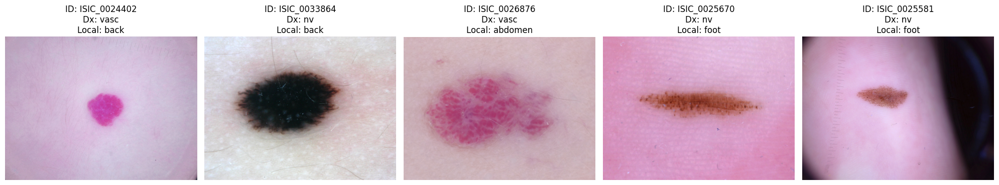

In [42]:
babies_df = train_df[train_df['age'] == 0].sample(min(5, len(train_df[train_df['age'] == 0])))

# see if these missing values could mean "no year" / months of ages / babies
plt.figure(figsize=(20, 10))
for i, (index, row) in enumerate(babies_df.iterrows()):
    plt.subplot(1, 5, i + 1)
    img = mpimg.imread(row['image_path'])
    plt.imshow(img)
    plt.title(f"ID: {row['image_id']}\nDx: {row['dx']}\nLocal: {row['localization']}")
    plt.axis('off')

plt.tight_layout()
plt.show()

The previous visualization attempts were inclusive. Due to the standardized close-up nature of dermoscopic images, we cannot confirm or deny if cases of Age 0 or NaN correspond to infants simply by analyzing skin texture, scale, or the presence of hair.

However, a multivariate analysis linking the missing ages with the diagnoses (dx) provides crucial evidence. Our previous diagnosis table showed that there are 2 cases of Melanoma (mel) among the 57 individuals with missing ages.
From a clinical and statistical standpoint, pediatric melanoma is extremely rare. If we were to assume all 57 cases with missing age are infants (Age 0), the prevalence of melanoma within this subgroup would be unfeasibly high ($3.5\%$), indicating a massive statistical anomaly.

This strongly suggests that these 57 individuals are, in fact, **adults whose age information was lost during the data collection process**.


### 4.1.2 Imputation Strategy Benchmark

The IterativeImputer is fitted on the training set only, then applied to all splits.


In [43]:
def prepare_ohe(df):
    """One-hot encode categorical columns for imputation."""
    subset = df[['age', 'dx', 'sex', 'localization']].copy()
    return pd.get_dummies(subset, columns=['dx', 'sex', 'localization'])

train_ohe = prepare_ohe(train_df)

# Align all splits to the same OHE columns (fill any missing categories with 0)
val_ohe  = prepare_ohe(val_df).reindex(columns=train_ohe.columns, fill_value=0)
test_ohe = prepare_ohe(test_df).reindex(columns=train_ohe.columns, fill_value=0)

# Benchmark on training set only
knn_imputer = KNNImputer(n_neighbors=5)
knn_imputer.fit(train_ohe)
imputed_knn_train = knn_imputer.transform(train_ohe)

it_imputer_bench = IterativeImputer(random_state=42, max_iter=10)
it_imputer_bench.fit(train_ohe)
imputed_it_train = it_imputer_bench.transform(train_ohe)

bench_df = train_df[['age']].copy()
bench_df['age_knn']       = imputed_knn_train[:, 0]
bench_df['age_iterative'] = imputed_it_train[:, 0]
bench_df['age_median']    = train_df['age'].fillna(train_df['age'].median())

print(bench_df[['age', 'age_knn', 'age_iterative', 'age_median']].head())
""" ---- ANTIGO ----

imput_df = merged_df[['age', 'dx', 'sex', 'localization']].copy()

#one hot encoder for categorical
df_ohe = pd.get_dummies(imput_df, columns=['dx', 'sex', 'localization'])

#1-KNN imputer
knn_imputer = KNNImputer(n_neighbors=5)
imputed_knn_data = knn_imputer.fit_transform(df_ohe)

#2-iterative imputer
it_imputer = IterativeImputer(random_state=42, max_iter=10)
imputed_it_data = it_imputer.fit_transform(df_ohe)

imput_df['age_knn'] = imputed_knn_data[:, 0]
imput_df['age_iterative'] = imputed_it_data[:, 0]
imput_df['age_median'] = imput_df['age'].fillna(imput_df['age'].median())

print(imput_df[['age', 'age_knn', 'age_iterative', 'age_median']].head())
"""

    age  age_knn  age_iterative  age_median
0  65.0     65.0           65.0        65.0
1  50.0     50.0           50.0        50.0
2  30.0     30.0           30.0        30.0
3  65.0     65.0           65.0        65.0
4  45.0     45.0           45.0        45.0


" ---- ANTIGO ----\n\nimput_df = merged_df[['age', 'dx', 'sex', 'localization']].copy()\n\n#one hot encoder for categorical\ndf_ohe = pd.get_dummies(imput_df, columns=['dx', 'sex', 'localization'])\n\n#1-KNN imputer\nknn_imputer = KNNImputer(n_neighbors=5)\nimputed_knn_data = knn_imputer.fit_transform(df_ohe)\n\n#2-iterative imputer\nit_imputer = IterativeImputer(random_state=42, max_iter=10)\nimputed_it_data = it_imputer.fit_transform(df_ohe)\n\nimput_df['age_knn'] = imputed_knn_data[:, 0]\nimput_df['age_iterative'] = imputed_it_data[:, 0]\nimput_df['age_median'] = imput_df['age'].fillna(imput_df['age'].median())\n\nprint(imput_df[['age', 'age_knn', 'age_iterative', 'age_median']].head())\n"

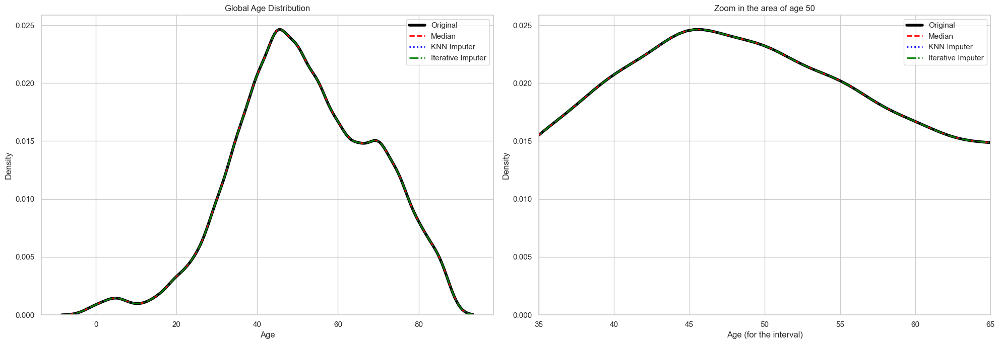

In [44]:
sns.set_theme(style="whitegrid")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

plot_params = [
    (bench_df['age'].dropna(), 'Original', 'black', 4, '-'),
    (bench_df['age_median'], 'Median', 'red', 2, '--'),
    (bench_df['age_knn'], 'KNN Imputer', 'blue', 2, ':'),
    (bench_df['age_iterative'], 'Iterative Imputer', 'green', 2, '-.')
]

for data, label, color, width, style in plot_params:
    sns.kdeplot(data, label=label, color=color, lw=width, ls=style, ax=ax1)
    sns.kdeplot(data, label=label, color=color, lw=width, ls=style, ax=ax2)

# graph 1: complete view
ax1.set_title('Global Age Distribution')
ax1.set_xlabel('Age')
ax1.legend()

# graph 2: zoom in the max
median = bench_df['age'].median()
ax2.set_xlim(median - 15, median + 15)
ax2.set_title(f'Zoom in the area of age {int(median)}')
ax2.set_xlabel('Age (for the interval)')
ax2.legend()

plt.tight_layout()
plt.show()

**REVER !!!**
This analysis confirms that the Iterative Imputer is the best strategy for this dataset. While Median imputation introduces a significant artificial spike that distorts the natural age distribution, the Iterative method closely represents the original curve. By preserving the statistical variance and population density, this approach prevents the neural network from learning biased patterns during training. Therefore, the **Iterative Imputer** is chosen as the final method to ensure high data integrity.

### 4.1.3 Imputation Implementation

In [45]:
# Fit on train only
it_imputer = IterativeImputer(random_state=42, max_iter=10)
it_imputer.fit(train_ohe)

IterativeImputer(random_state=42)

In [46]:
# Apply to all splits
train_df = train_df.copy()
val_df   = val_df.copy()
test_df  = test_df.copy()

In [47]:
train_df['age'] = it_imputer.transform(train_ohe)[:, 0]
val_df['age']   = it_imputer.transform(val_ohe)[:, 0]
test_df['age']  = it_imputer.transform(test_ohe)[:, 0]

In [48]:
print(f"Age nulls after imputation — Train: {train_df['age'].isnull().sum()}, "
      f"Val: {val_df['age'].isnull().sum()}, Test: {test_df['age'].isnull().sum()}")

Age nulls after imputation — Train: 0, Val: 0, Test: 0


With this implementation, the dataset achieves 100% completion and provides a high quality base for the subsequent pre processing stages.

## 4.2 Outliers

This section focuses exclusively on the identification and treatment of technical outliers.
In the context of medical imaging, we considered that clinical outliers (rare or atypical lesions) should be completely preserved, as they are the core of the study. Therefore, the focus will be on technical outliers, since they can degrade model performance and should be flagged for review.

In [49]:
def show_images(df, title, n=12):
    """Display a grid of images for visual inspection."""
    plt.figure(figsize=(15, 12))
    sample = df.sample(min(n, len(df)))

    for i, (_, row) in enumerate(sample.iterrows()):
        plt.subplot(3, 4, i+1)
        img = Image.open(row["image_path"])
        plt.imshow(img)
        plt.title(row["image_id"], fontsize=8)
        plt.axis("off")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

### 4.2.1 Brightness and Contrast

Images with extreme pixel‑intensity statistics using the 1st and 99th percentiles:
  - High brightness outliers - images that are overexposed
  - Low brightness outliers - images that are underexposed
  - Low contrast outliers - images lacking texture information

In [50]:
# thresholds
bright_thr = train_df["img_mean"].quantile(0.99)
dark_thr   = train_df["img_mean"].quantile(0.01)
low_contrast_thr = train_df["img_std"].quantile(0.01)

# subsets
outliers_bright = train_df[train_df["img_mean"] > bright_thr]
outliers_dark = train_df[train_df["img_mean"] < dark_thr]
outliers_low_contrast = train_df[train_df["img_std"] < low_contrast_thr]

print(len(outliers_bright), "bright outliers")
print(len(outliers_dark), "dark outliers")
print(len(outliers_low_contrast), "low contrast outliers")

80 bright outliers
80 dark outliers
80 low contrast outliers


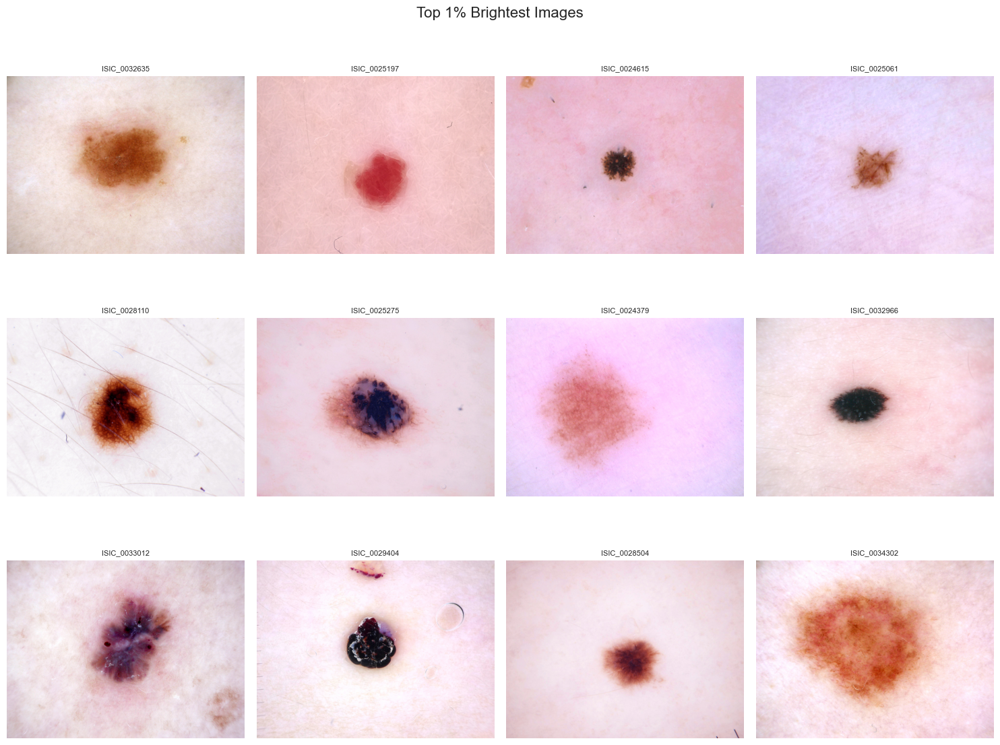

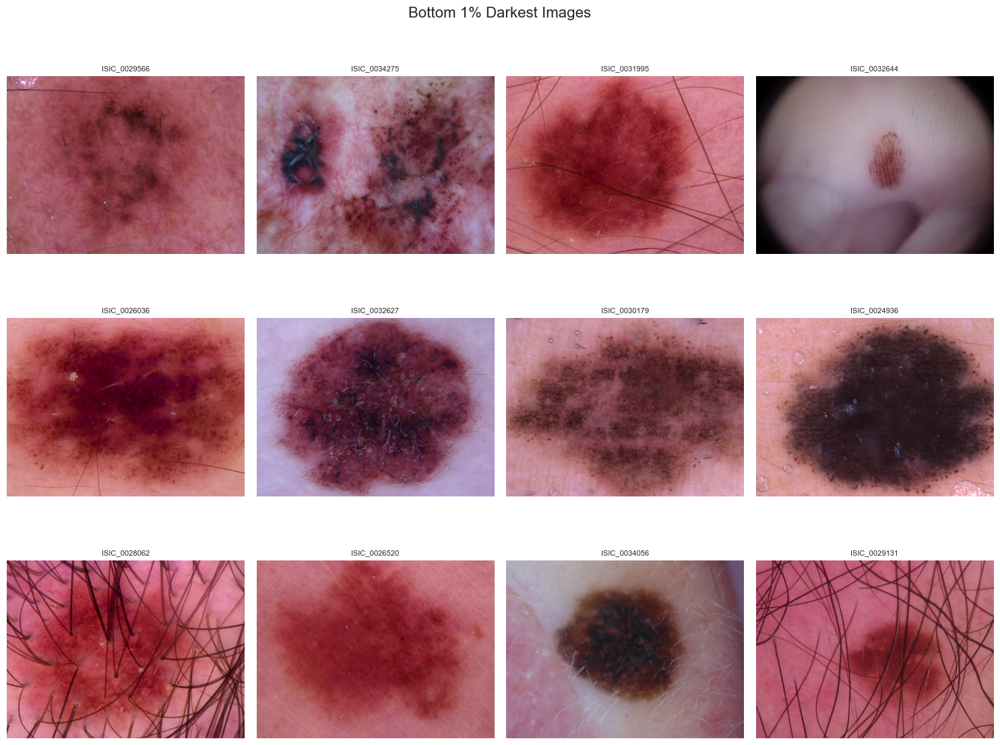

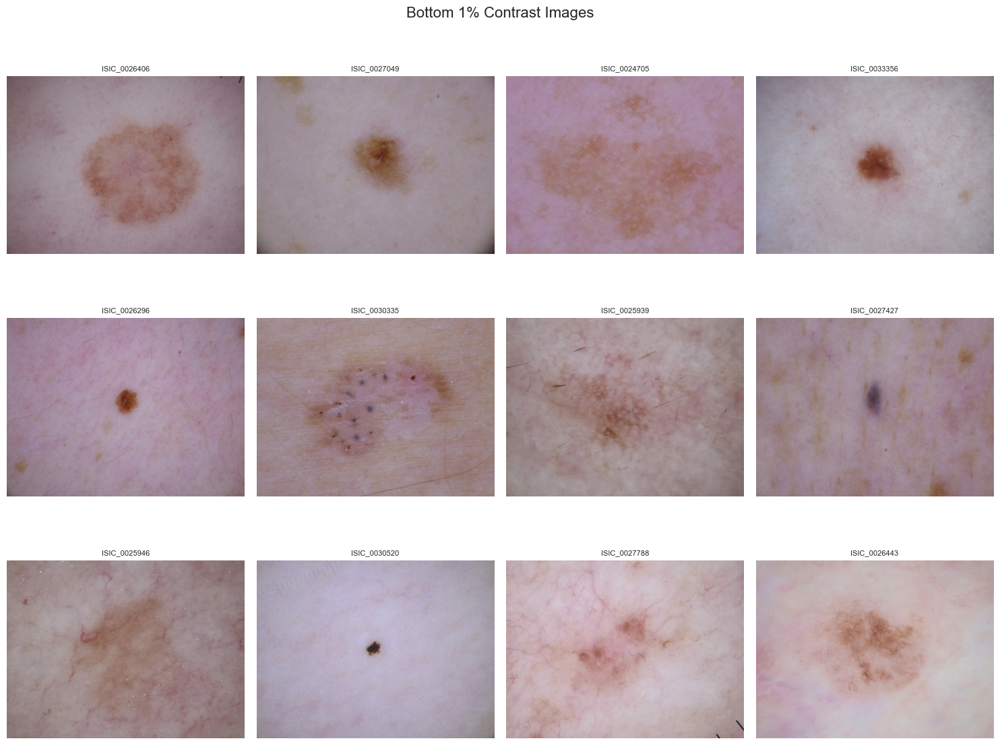

In [51]:
show_images(outliers_bright, "Top 1% Brightest Images")
show_images(outliers_dark, "Bottom 1% Darkest Images")
show_images(outliers_low_contrast, "Bottom 1% Contrast Images")

Visual inspection of the statistical outliers based on pixel intensity quantiles revealed critical acquisition patterns that could impact model generalization:

- High Brightness (Overexposure): The top 1% brightest images frequently exhibit "washed-out" skin tones possibly caused by aggressive flash photography and/or naturally lighter skin tones.

- Low Brightness & Vignetting: Some skin lesions have typically daker tones, nevertheless, a few darkest outliers suffer from significant vignetting (radial darkening) and/or body hair. This optical artifact skews the global intensity mean and risks introducing a "shortcut" where the model might incorrectly associate dark borders with specific pathological classes.

**Technical Implications:** While both cases could impact the model, the lesion morphology remains largely visible, meaning we shouldn't remove them. These findings justify the implementation of Color Normalization (e.g., Shades of Gray) and Histogram Equalization (CLAHE) to standardize the illumination profile across the dataset, which should be considered for the dataset preparation to modelling.



### 4.2.2. Semantic Outliers via UMAP Embeddings

  - Extract deep embeddings using a pretrained ResNet18
  - Project them into 2D space using UMAP
  - Compute each image’s distance to the embedding centroid
  - Flag the top 1% most distant samples

In [52]:
# Extract embeddings for training set only
embed_model = models.resnet18(pretrained=True)
embed_model = torch.nn.Sequential(*list(embed_model.children())[:-1])
embed_model.eval()

transform = T.Compose([T.Resize((224, 224)), T.ToTensor()])

def extract_embeddings(df):
    embs = []
    for path in tqdm(df["image_path"], desc="Extracting embeddings"):
        img = Image.open(path).convert("RGB")
        x = transform(img).unsqueeze(0)
        with torch.no_grad():
            emb = embed_model(x).squeeze().numpy()
        embs.append(emb)
    return np.array(embs)

train_embeddings = extract_embeddings(train_df)
val_embeddings   = extract_embeddings(val_df)
test_embeddings  = extract_embeddings(test_df)

C:\Users\tomas\AppData\Roaming\Python\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\tomas\AppData\Roaming\Python\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracting embeddings: 100%|██████████| 999/999 [00:49<00:00, 20.36it/s]


In [53]:
# Fit UMAP on training embeddings only
train_reducer = umap.UMAP(random_state=42)
train_embedding_2d = train_reducer.fit_transform(train_embeddings)

# Transform val and test using the fitted reducer (no refit)
val_embedding_2d  = train_reducer.transform(val_embeddings)
test_embedding_2d = train_reducer.transform(test_embeddings)

c:\Users\tomas\anaconda3\envs\clean_ml\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP distance threshold (train 99th pct): 6.9542
Train: 80 UMAP outliers
Val: 10 UMAP outliers
Test: 9 UMAP outliers


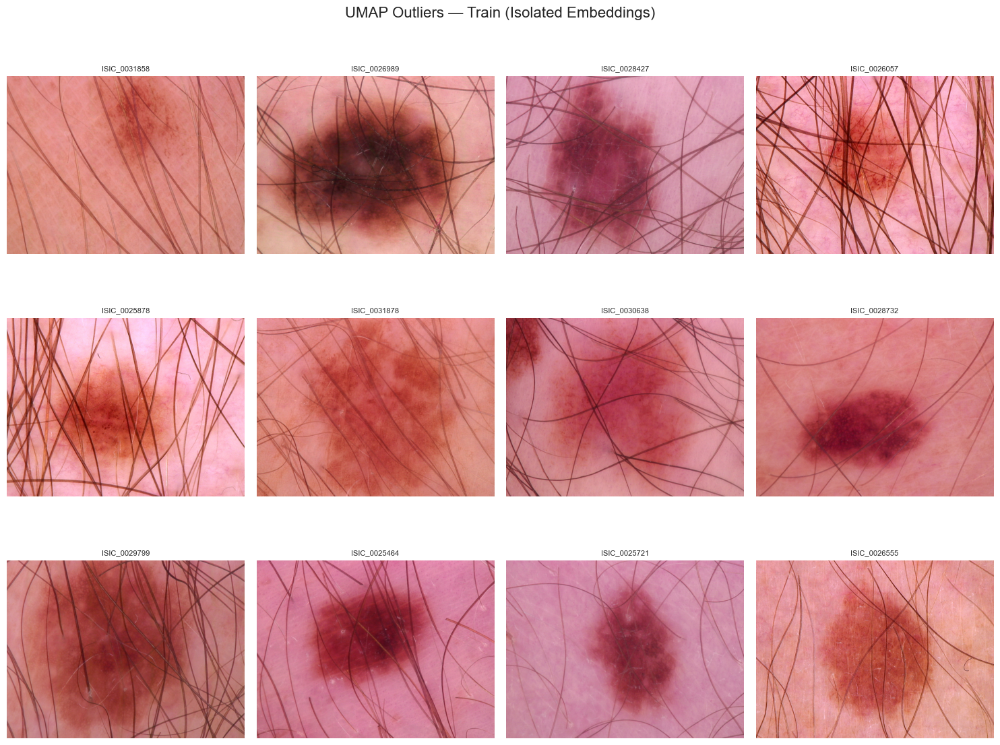

In [54]:
# Centroid and threshold computed on training set only
train_centroid = train_embedding_2d.mean(axis=0)
train_distances = pairwise_distances(train_embedding_2d, train_centroid.reshape(1, -1)).flatten()
umap_thr = np.quantile(train_distances, 0.99)

train_df = train_df.copy()
val_df   = val_df.copy()
test_df  = test_df.copy()

train_df["umap_dist"] = train_distances
val_df["umap_dist"]   = pairwise_distances(val_embedding_2d,  train_centroid.reshape(1, -1)).flatten()
test_df["umap_dist"]  = pairwise_distances(test_embedding_2d, train_centroid.reshape(1, -1)).flatten()

print(f"UMAP distance threshold (train 99th pct): {umap_thr:.4f}")
for name, df in [("Train", train_df), ("Val", val_df), ("Test", test_df)]:
    print(f"{name}: {(df['umap_dist'] > umap_thr).sum()} UMAP outliers")

outliers_umap_train = train_df[train_df["umap_dist"] > umap_thr]
show_images(outliers_umap_train, "UMAP Outliers — Train (Isolated Embeddings)")

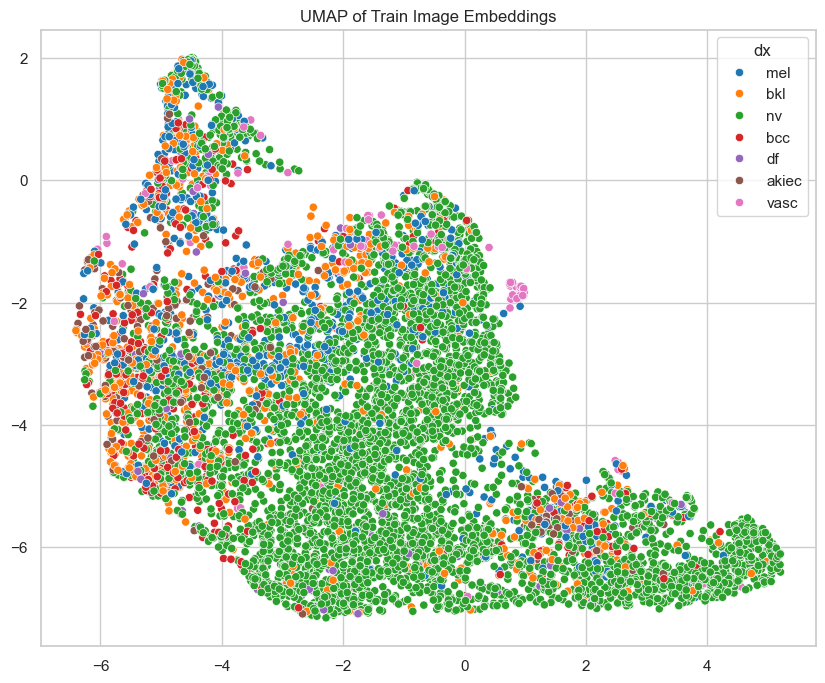

In [55]:
# UMAP plot coloured by diagnosis
plt.figure(figsize=(10, 8))
sns.scatterplot(x=train_embedding_2d[:, 0], y=train_embedding_2d[:, 1],
                hue=train_df["dx"], palette="tab10")
plt.title("UMAP of Train Image Embeddings")
plt.show()

The UMAP dimensional projection successfully isolated a cluster of images whose distance from the embedding centroid is significantly higher than the dataset average. Analysis of these samples reveals a dominant confounding factor:

- Occlusion by Body Hair: Nearly 100% of the identified UMAP outliers display a high density of terminal hair overlying the lesion. The presence of high-contrast, dark linear structures creates a digital signature that "drowns out" the underlying morphological features. The fact that UMAP isolates these images proves that hair is not merely visual noise, but a structural feature that fundamentally shifts the latent distribution of the data.

**Mitigation Strategy**: To prevent the Deep Learning model from learning non-biological artifacts, a Hair Removal pipeline (e.g., DullRazor) is required. This step ensures the CNN focuses on dermatological patterns rather than occlusion artifacts.

In [56]:
# Flag outliers in all splits (using train-derived thresholds)
for df in [train_df, val_df, test_df]:
    df["is_outlier"] = (
        (df["img_mean"] > bright_thr) |
        (df["img_mean"] < dark_thr)   |
        (df["img_std"]  < low_contrast_thr) |
        (df["umap_dist"] > umap_thr)
    )

for name, df in [("Train", train_df), ("Val", val_df), ("Test", test_df)]:
    print(f"{name} outliers flagged: {df['is_outlier'].sum()}")

Train outliers flagged: 316
Val outliers flagged: 34
Test outliers flagged: 34


### 4.2.3 Outlier Remediation Pipeline

To ensure the Deep Learning model learns dermatological features rather than photographic characteristucs, we apply a three-step cleaning process.

1. **Hair Removal (DullRazor Algorithm)**
Since hairs are high-contrast linear occlusions, we use the DullRazor approach:
    - Morphological Blackhat Filtering: Isolate dark, thin structures from the background.
    - Binary Masking: Create a precise map of every hair strand.
    - Telea Inpainting: Replace the "hair pixels" with a smooth interpolation of the surrounding skin texture.

2. **Spatial Standardization (Center Cropping)**
To mitigate Vignetting (dark corners) and focus the model's attention:
    - We perform a 10% marginal crop on all sides.
    - Since clinical dermoscopy typically centers the lesion, this removes the most distorted parts of the lens frame without losing diagnostic data.

3. **Illumination Normalization (CLAHE)**
To handle Overexposure and Low Contrast:
    - We convert the image to the CIE Lab color space.
    <!-- - We apply CLAHE (Contrast Limited Adaptive Histogram Equalization) to the L (Luminance) channel. CLAHE enhances local contrast in small tiles, bringing back "washed out" details in bright areas without amplifying noise. -->

In [57]:
def dull_razor(img):
    """Removes hair artifacts using morphological blackhat filtering."""
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))
    blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
    _, mask = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)
    dst = cv2.inpaint(img, mask, inpaintRadius=1, flags=cv2.INPAINT_TELEA)
    return dst

def fix_illumination(img):
    """Standardizes brightness via CLAHE and removes peripheral vignetting."""
    # 1. Center Crop (10% margin removal to eliminate lens vignetting)
    h, w = img.shape[:2]
    img = img[int(h*0.1):int(h*0.9), int(w*0.1):int(w*0.9)]

    # 2. CLAHE on the L-channel (Lab color space)
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    img_corrected = cv2.cvtColor(cv2.merge((cl, a, b)), cv2.COLOR_LAB2RGB)
    return img_corrected

def clean_and_save_images(df, dest_dir):
    """Apply the full remediation pipeline to a DataFrame and save results."""
    os.makedirs(dest_dir, exist_ok=True)
    df = df.copy()
    df["cleaned_path"] = ""

    for idx, row in tqdm(df.iterrows(), total=len(df), desc=f"Cleaning → {dest_dir}"):
        try:
            img = cv2.imread(row["image_path"])
            if img is None:
                continue
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            img = dull_razor(img)
            img = fix_illumination(img)
            img = cv2.resize(img, (224, 224))

            new_filename = f"{row['image_id']}_cleaned.jpg"
            new_path = os.path.join(dest_dir, new_filename)
            cv2.imwrite(new_path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

            df.at[idx, "cleaned_path"] = new_path
        except Exception as e:
            print(f"Error processing {row['image_id']}: {e}")

    return df

In [58]:
# Process each split independently
processed_base = os.path.join(base_path, "HAM10000_cleaned")

train_df = clean_and_save_images(train_df, os.path.join(processed_base, "train"))
val_df   = clean_and_save_images(val_df,   os.path.join(processed_base, "val"))
test_df  = clean_and_save_images(test_df,  os.path.join(processed_base, "test"))

Cleaning → ./data\HAM10000_cleaned\test: 100%|██████████| 999/999 [00:54<00:00, 18.30it/s]


error: OpenCV(4.11.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


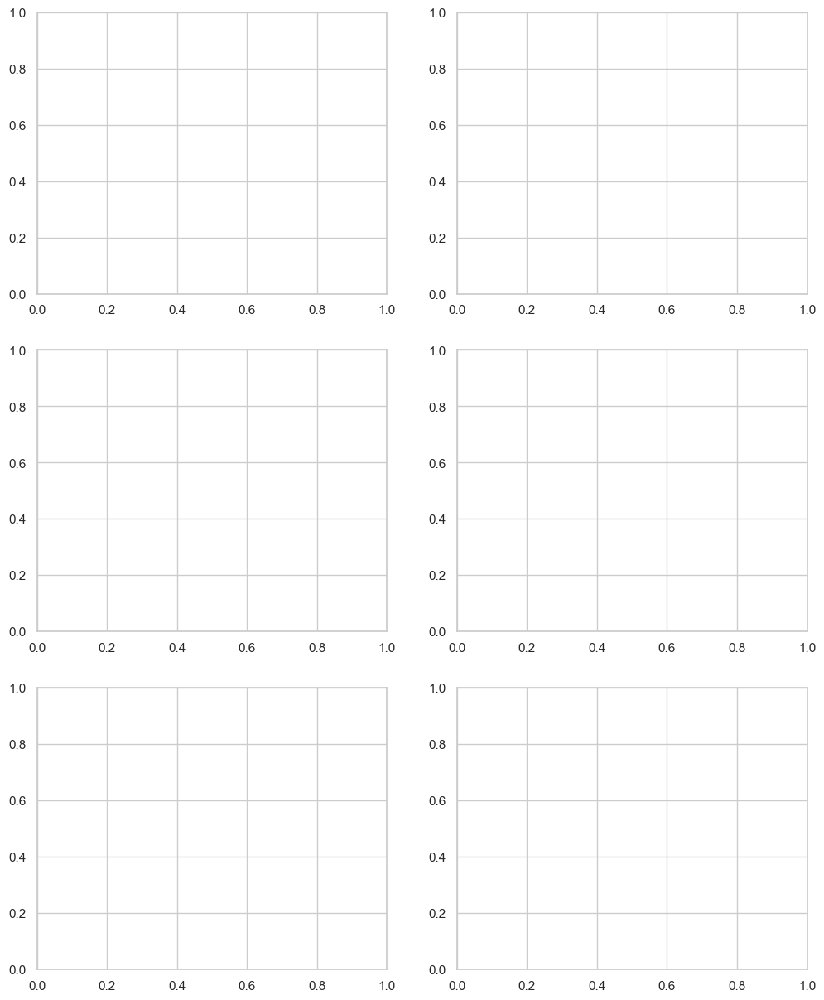

In [60]:
def verify_remediation(df, num_samples=3):
    # Target images previously identified as UMAP outliers
    samples = df[df["umap_dist"] > umap_thr].head(num_samples)

    fig, axes = plt.subplots(num_samples, 2, figsize=(12, num_samples * 5))

    for i, (idx, row) in enumerate(samples.iterrows()):
        # Load Original
        orig_path = row["image_path"]
        orig = cv2.imread(orig_path)
        orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)

        cleaned = cv2.imread(row["cleaned_path"])
        cleaned = cv2.cvtColor(cleaned, cv2.COLOR_BGR2RGB)

        axes[i, 0].imshow(orig)
        axes[i, 0].set_title(f"Original (Outlier): {row['image_id']}")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(cleaned)
        axes[i, 1].set_title(f"Cleaned and Standardized - remotion of body hair")
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

verify_remediation(merged_df)

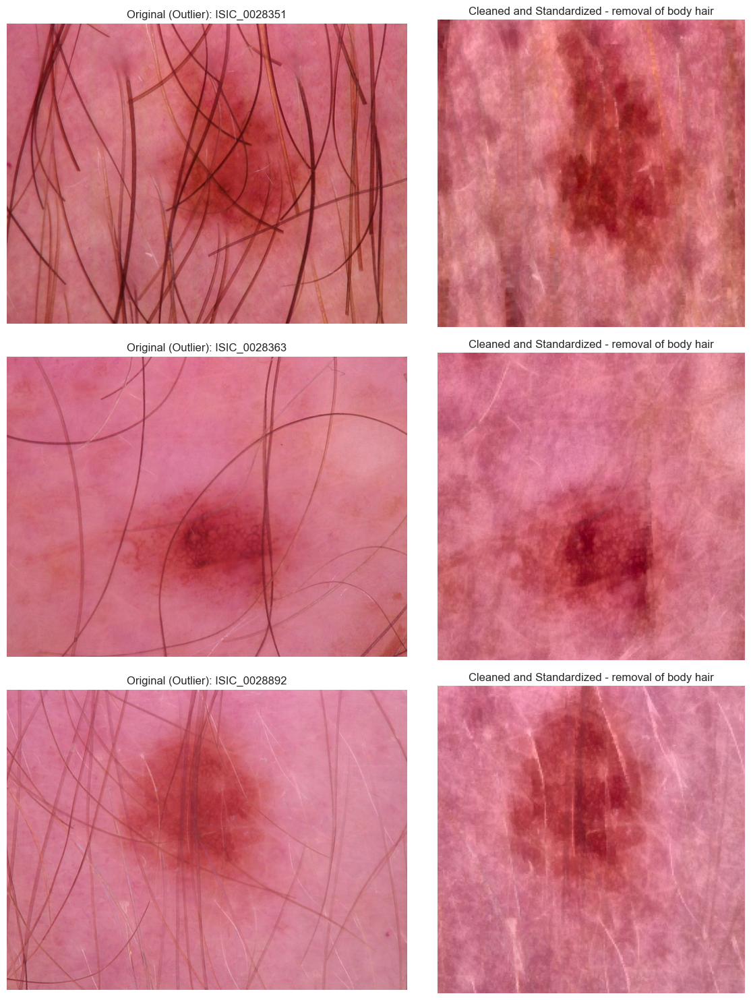

Successfully displayed 3 image pairs


In [ ]:
def verify_remediation(df, num_samples=3):
    # Target images previously identified as UMAP outliers
    samples = df[df["umap_dist"] > umap_thr].head(num_samples)
    fig, axes = plt.subplots(num_samples, 2, figsize=(12, num_samples * 5))
    
    valid_count = 0
    for i, (idx, row) in enumerate(samples.iterrows()):
        # Load Original
        orig_path = row["image_path"]
        filename = os.path.basename(row["cleaned_path"])
        
        # Search for cleaned image in subdirectories
        cleaned_path = None
        for subdir in ["train", "val", "test"]:
            potential_path = f"data/HAM10000_cleaned/{subdir}/{filename}"
            if os.path.exists(potential_path):
                cleaned_path = potential_path
                break
        
        if cleaned_path is None:
            print(f"Warning: Cleaned image not found for {row['image_id']}")
            continue
        
        # Load images
        orig = cv2.imread(orig_path)
        if orig is None:
            print(f"Error reading original image: {orig_path}")
            continue
            
        cleaned = cv2.imread(cleaned_path)
        if cleaned is None:
            print(f"Error reading cleaned image: {cleaned_path}")
            continue
        
        # Convert colors
        orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
        cleaned = cv2.cvtColor(cleaned, cv2.COLOR_BGR2RGB)
        
        # Plot
        axes[valid_count, 0].imshow(orig)
        axes[valid_count, 0].set_title(f"Original (Outlier): {row['image_id']}")
        axes[valid_count, 0].axis('off')
        
        axes[valid_count, 1].imshow(cleaned)
        axes[valid_count, 1].set_title(f"Cleaned and Standardized - removal of body hair")
        axes[valid_count, 1].axis('off')
        
        valid_count += 1
        if valid_count >= num_samples:
            break
    
    plt.tight_layout()
    plt.show()

verify_remediation(merged_df)

## 4.3 Label Encoding

In [76]:
label2idx = {label: i for i, label in enumerate(sorted(train_df["dx"].unique()))}
idx2label = {i: label for label, i in label2idx.items()}

train_df["dx_encoded"] = train_df["dx"].map(label2idx)
val_df["dx_encoded"] = val_df["dx"].map(label2idx)
test_df["dx_encoded"] = test_df["dx"].map(label2idx)

In [82]:
# Exporting the label encoding dict
with open("label2idx.json", "w") as f:
    json.dump(label2idx, f)

## 5. Save Final Splits

In [78]:
train_df.to_csv(os.path.join(base_path, "train_split.csv"), index=False)
val_df.to_csv(  os.path.join(base_path, "val_split.csv"),   index=False)
test_df.to_csv( os.path.join(base_path, "test_split.csv"),  index=False)

print("All splits saved. Pipeline complete.")
print(f"Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")

All splits saved. Pipeline complete.
Train: 7976 | Val: 1037 | Test: 999
